<a href="https://colab.research.google.com/github/krishnakanthkona-3110/Interview_Prep/blob/main/Interview_Focused/30_AI_Agent_Interview_Questions__(MCP%2C_A2A%2C_LangGraph%2C_CrewAI).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Gen AI and Agentic AI:-
Generative AI focuses on creating content (text, images, code, etc.) from a prompt, whereas Agentic AI focuses on achieving a goal by planning, reasoning, using tools, observes the results and taking actions autonomously.

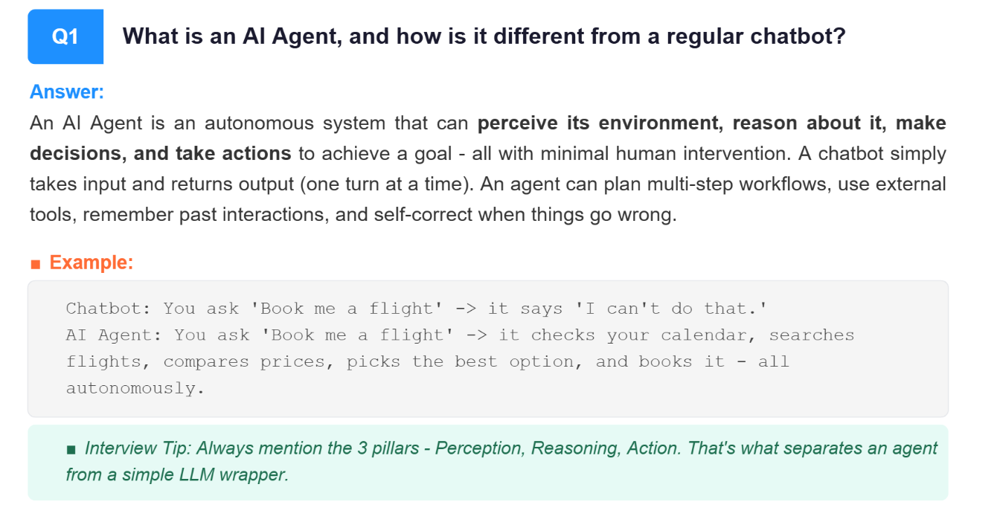

AI Agent is an Autonomous system that can



*   Perceive - Information from the environment
*   Reason - what needs to be done

*   Take action - by using tools or API's






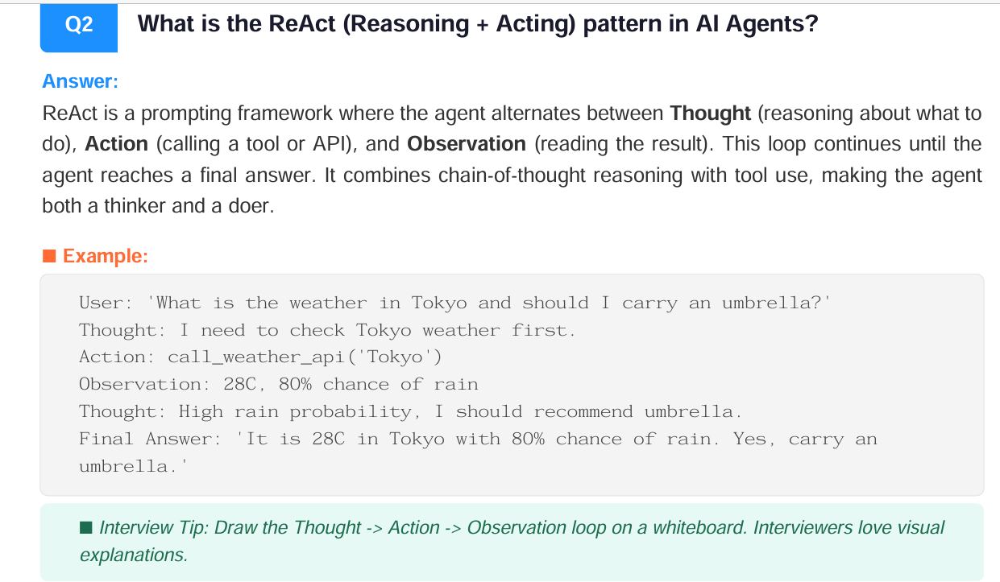

ReAct stands for Reasoning and Acting. It is a prompting framework where an LLM follows a cycle of Thought → Action → Observation. First, it reasons about the next step, then uses an external tool, API, or function if needed, observes the result, and repeats the process until it can generate the final answer.
This approach combines reasoning with tool usage, enabling AI agents to solve multi-step tasks more accurately than relying on the LLM's internal knowledge alone.

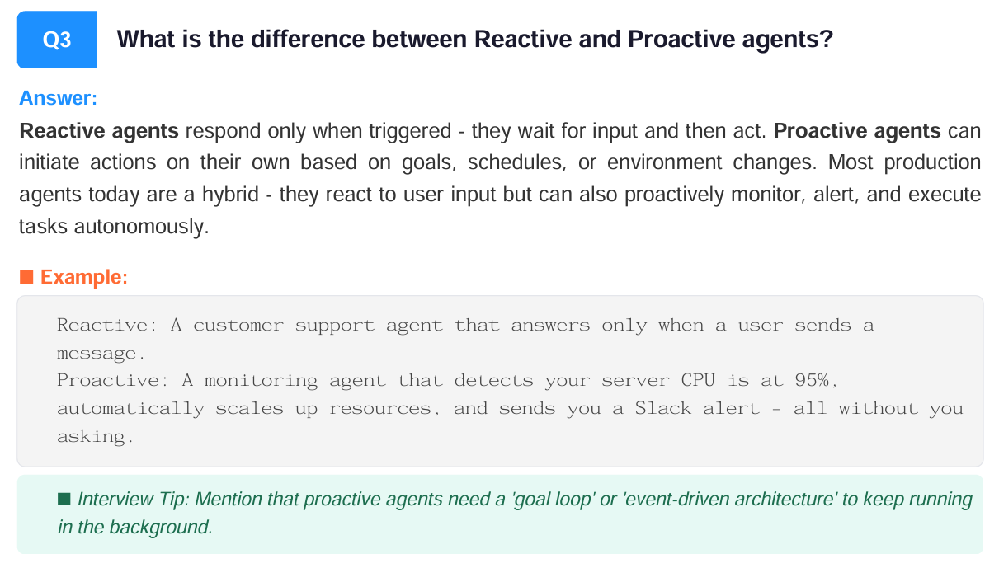

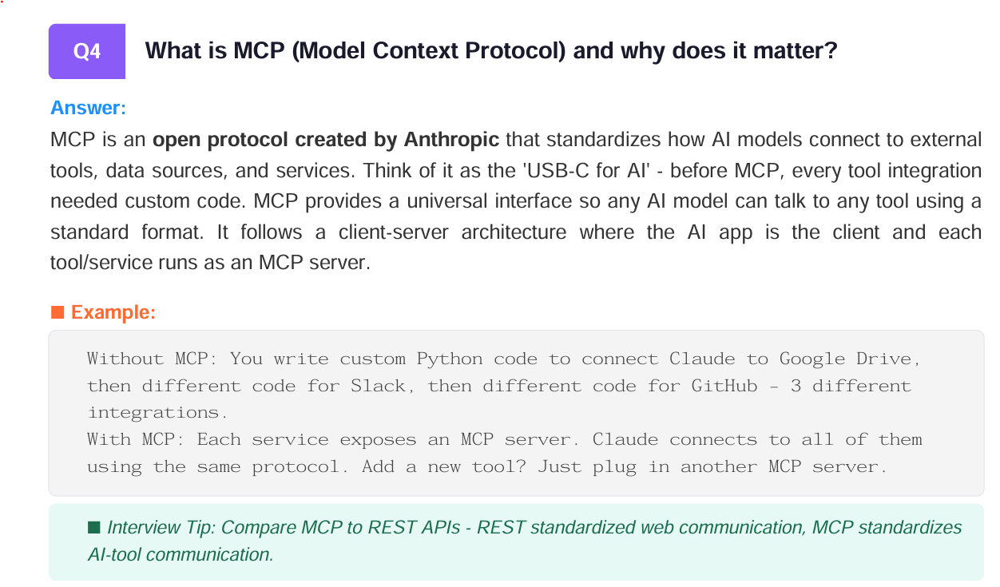

The Model Context Protocol (MCP) was introduced by Anthropic in 2024. It is open standard protocol that defines how AI applications (clients) connect to external tools and data (servers) through a uniform client-server architecture.


Without MCP, every AI application needs custom integrations for each tool or API. MCP provides a common protocol, allowing AI agents to discover and use tools in a consistent way, making integrations reusable and easier to maintain.

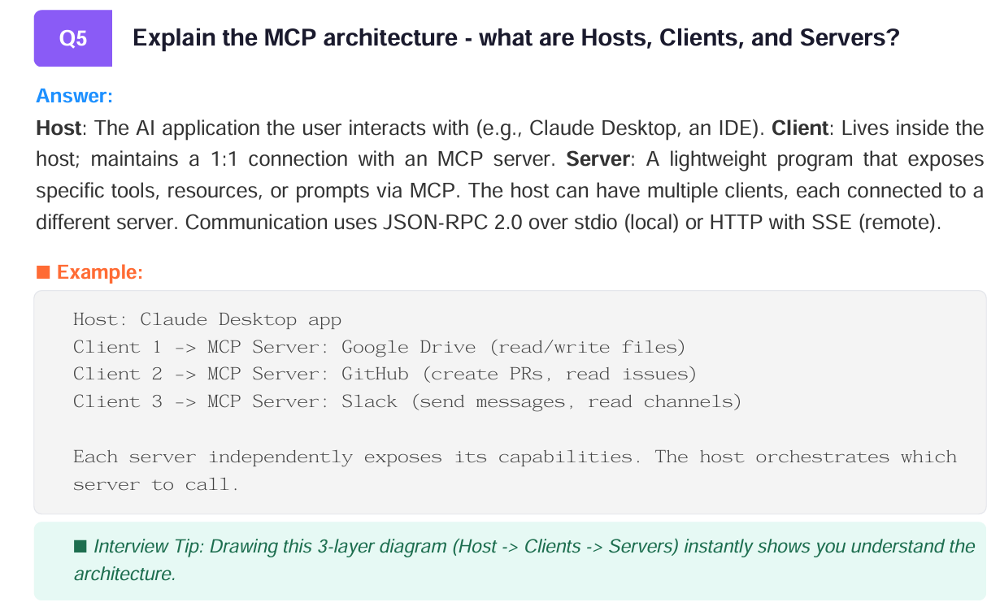

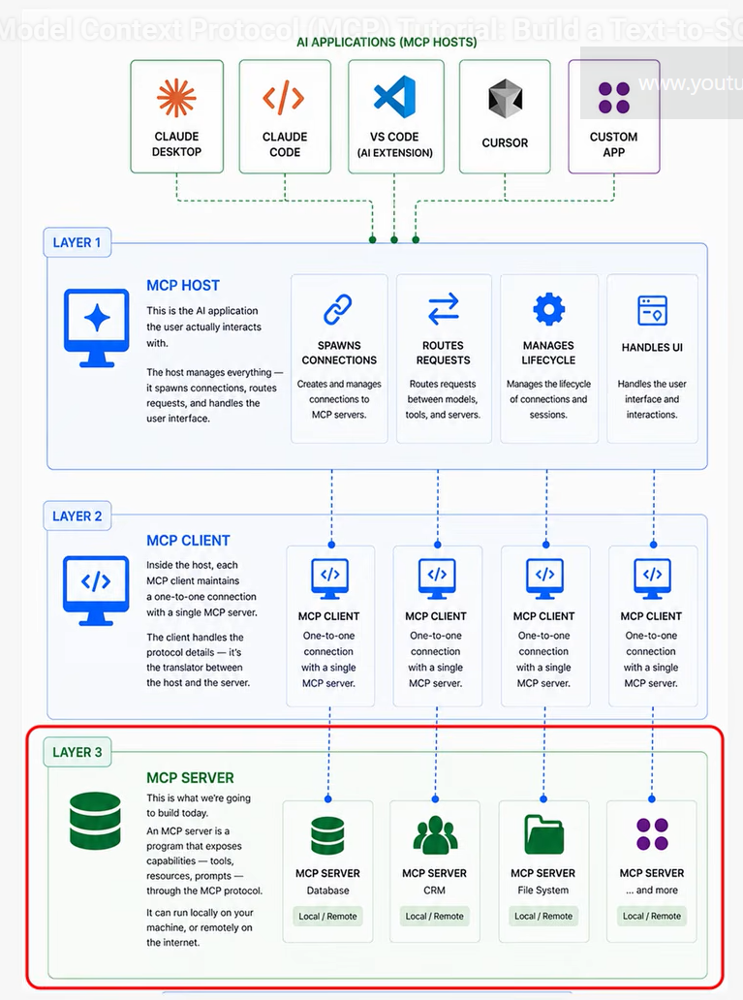

A Host runs the model and owns the conversation.

A client inside it speaks the protocol.

A server exposes tools with Typed Schemas and descriptions.

The client discovers these tools at runtime - so nothing is hard coded

- The model decides which one to call, and the server executes it.
- And because the transport is separate

MCP uses JSON-RPC 2.0 as the communication protocol between the MCP Client and the MCP Server. (the client and server communicate using JSON messages.)

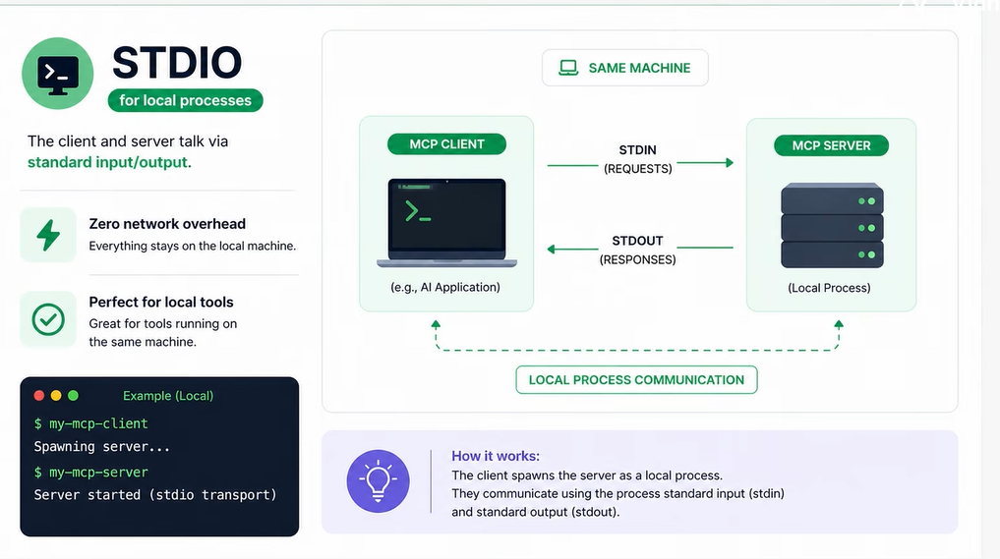

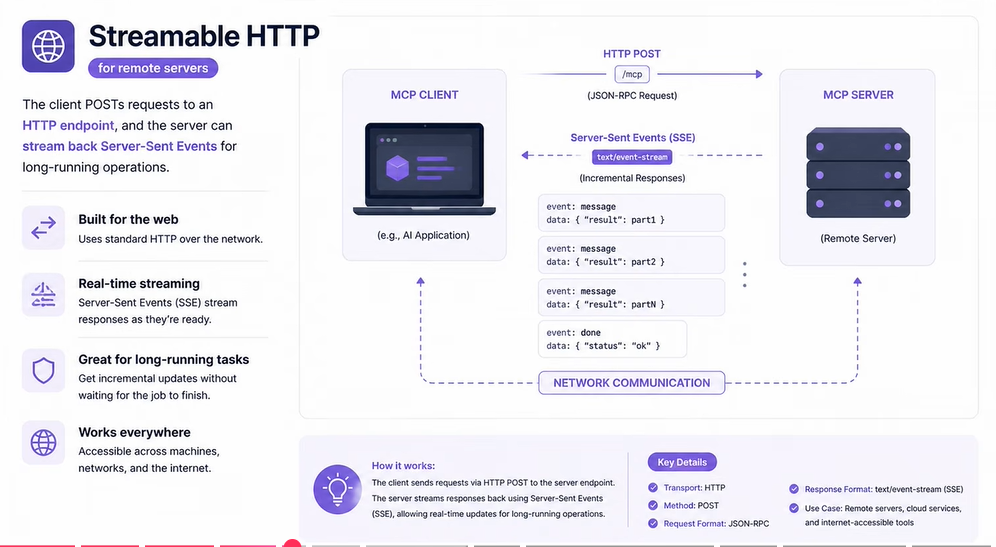

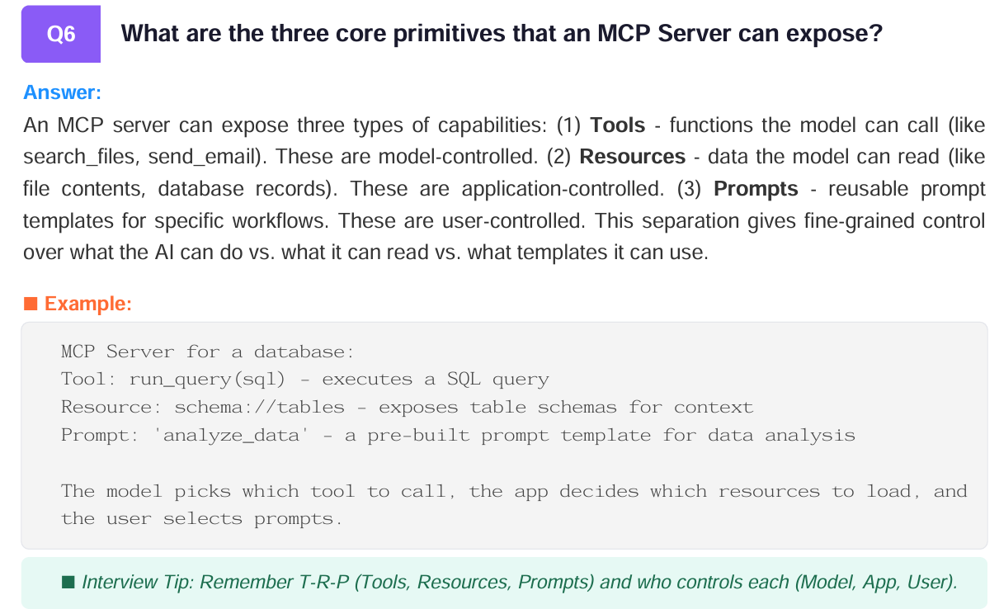

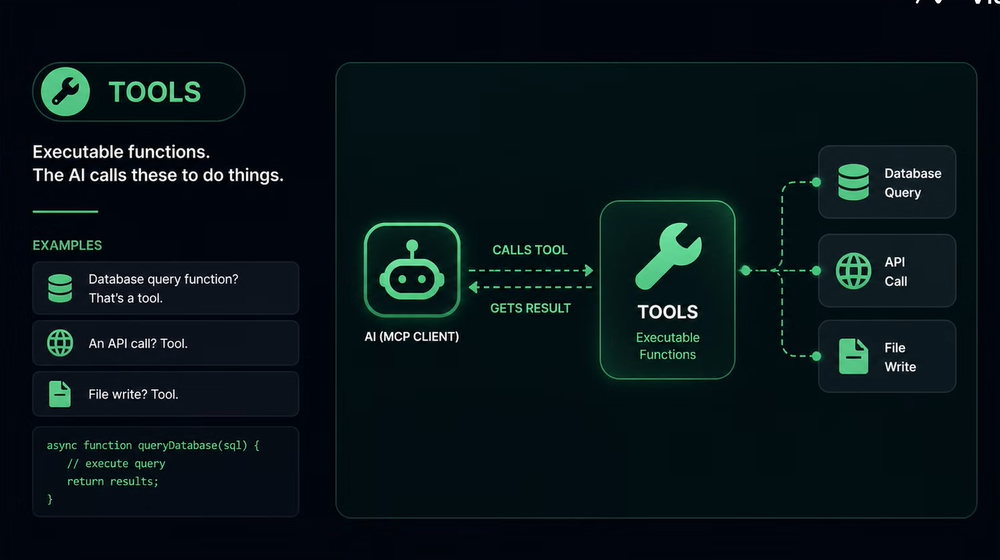

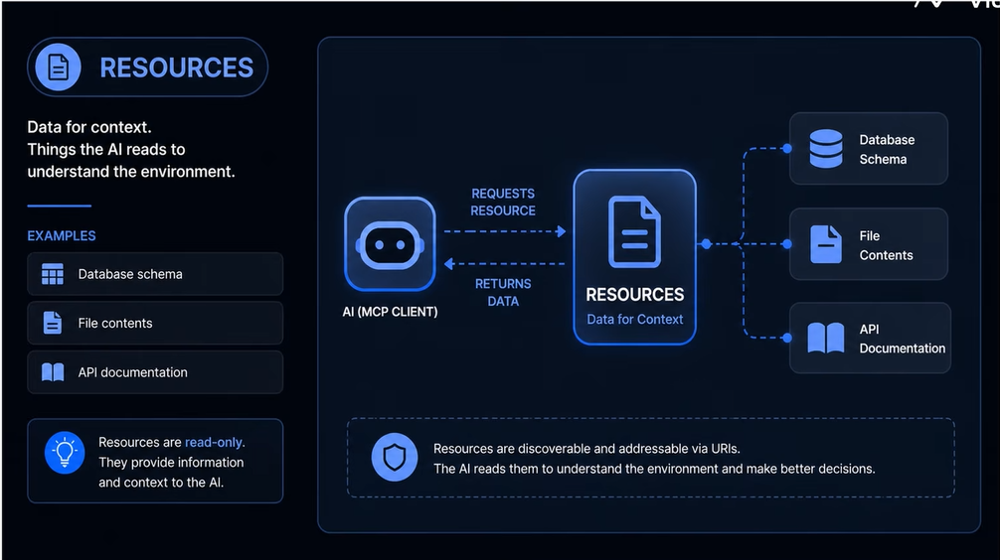

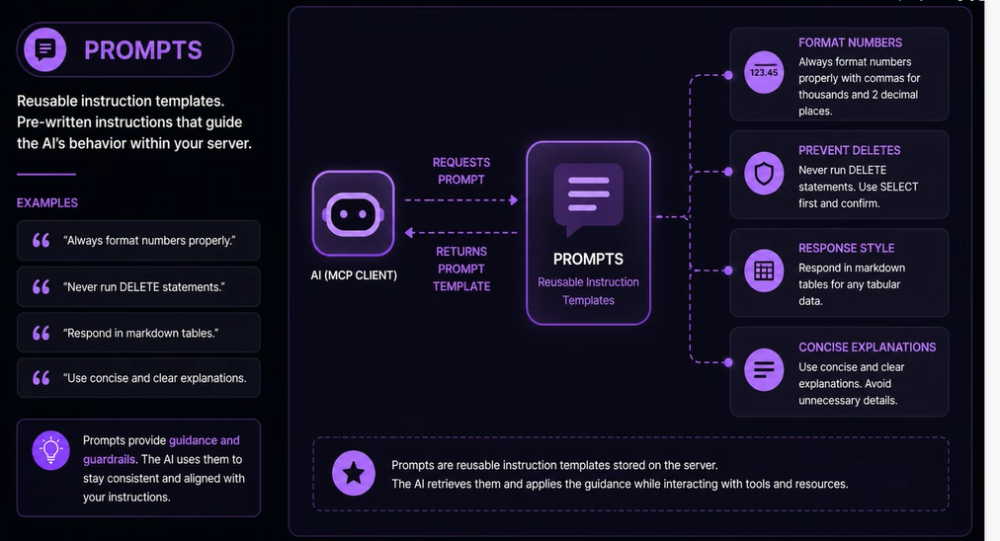

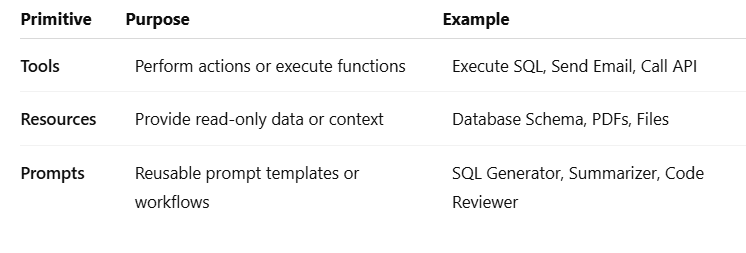



MCP servers expose three core primitives: Tools, Resources, and Prompts. Tools allow AI agents to perform actions such as calling APIs or executing SQL queries. Resources provide read-only data or context, such as files, documents, or database schemas. Prompts are reusable prompt templates that standardize how the AI performs common tasks. Together, these primitives enable AI agents to interact with external systems in a consistent and standardized way.

# while creating the tools
- Name the tools like Functions and provide clear Type Hints.
- Write the docstring like we're describing them to a new team mate who can't read the code.

# Model - Decides which tool to call,
# Protocol - carries the communication between client(agent) and the server
# Server - Executes the tool


- 1). The model (LLM/client-side agent) decides which tool to call and what arguments to pass — this is the reasoning step. The model doesn't call the tool directly; it emits a structured request (like "call tool X with these parameters").

- 2). The MCP protocol is the standardized communication layer between the client (e.g. your agent) and the server (which exposes tools). It defines the message format (JSON-RPC based) for things like:
  - Discovering what tools/resources a server offers
  - Sending a tool-call request with parameters
  - Returning the tool's result back to the client


- 3). The MCP server actually executes the tool — this is where the real logic lives (e.g., querying a database, running your SQL execution tool, doing schema discovery). It receives the structured request via the protocol and runs the actual function.

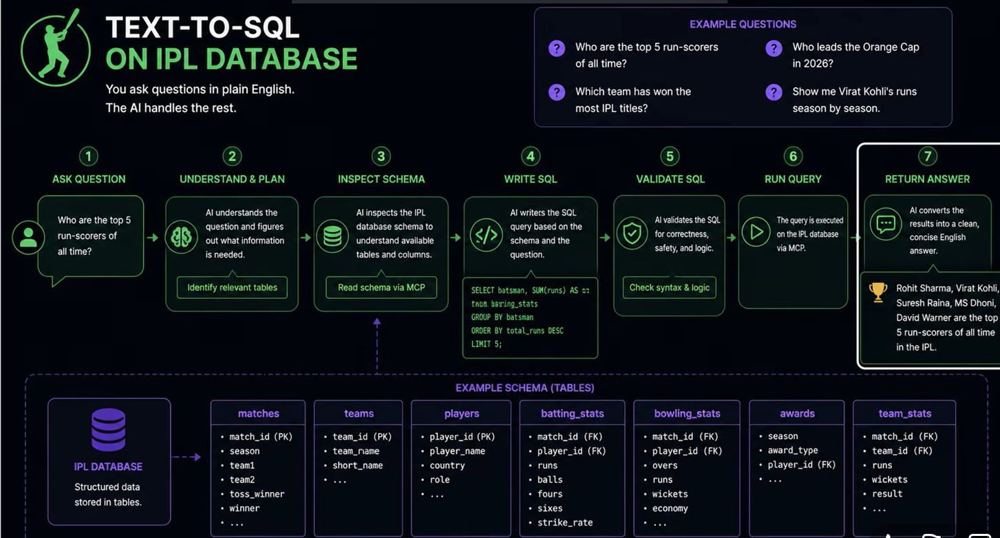

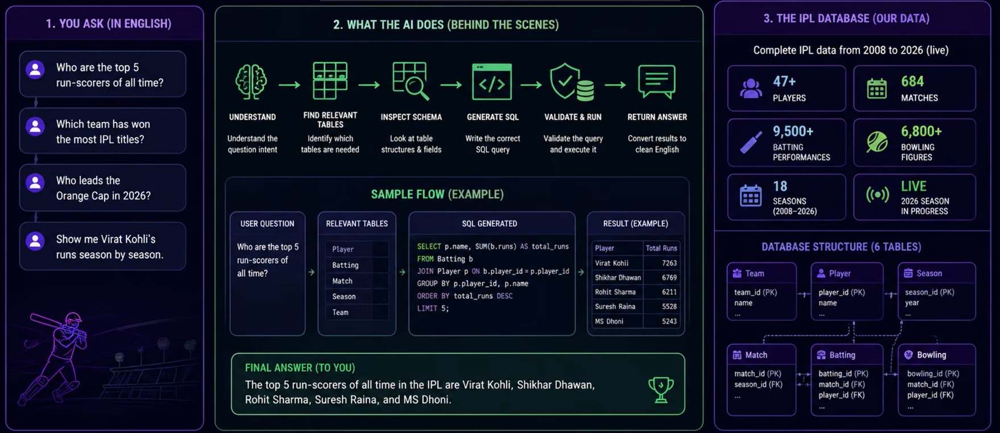

# Why does MCP exist — what problem does it solve?"

- Before MCP, every LLM app had to build custom, one-off integrations for each tool/data source (N models × M tools = N×M integrations). MCP standardizes this into N+M — any MCP-compatible client can talk to any MCP-compatible server.

# "What's the actual transport/protocol MCP uses?"

- MCP is built on JSON-RPC 2.0, and supports transports like stdio (local processes) and HTTP/SSE (remote servers).

# "What are the core primitives MCP servers expose?"

- Tools (callable functions), Resources (data the model can read), and Prompts (reusable prompt templates) — tools are the most commonly used one in agent-building.

# "How is this different from just using function calling / tool calling directly?"

- Function calling is the model-side capability to request a tool call — MCP is the standardized way to expose and connect those tools/servers, independent of which LLM provider you're using. Function calling is how the model asks; MCP is the plumbing connecting that ask to real tool execution across different servers.

- Tie it to your own project — this is the one that actually matters most for you specifically:

- "In my Text-to-SQL project, I built MCP-based tools for schema discovery and secure SQL execution — instead of hardcoding schema into every prompt, the agent could query for relevant tables/columns on demand via a standardized tool interface."

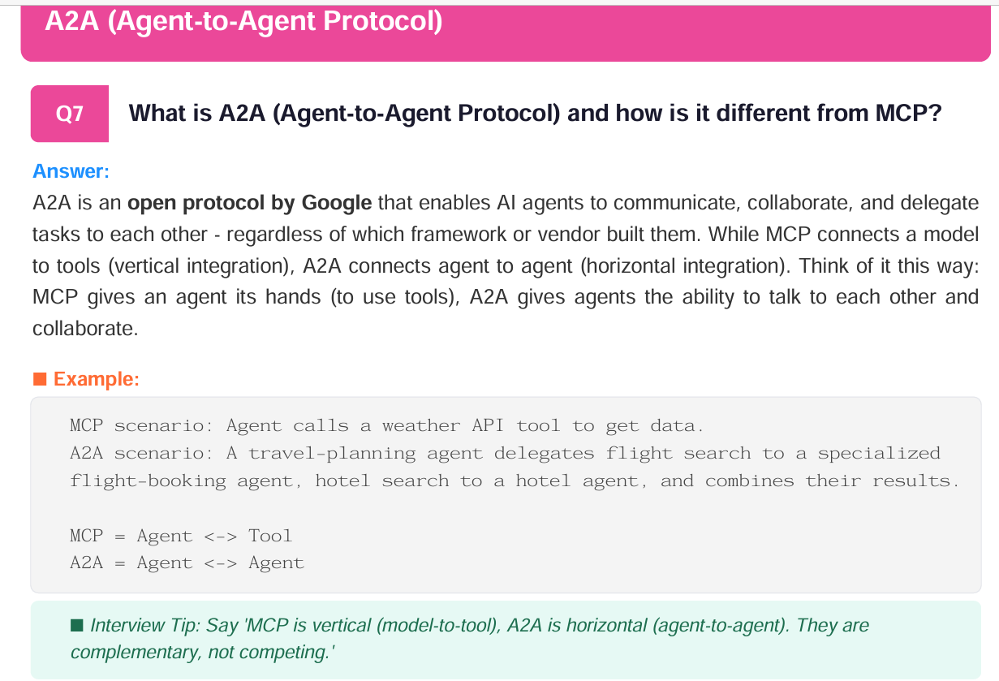

A2A is a open protocol that enables the AI agents to communicate and collaborate with each other.

MCP connects agent(model) to tools (Vertical integration), whereas A2A connects Agent to another agent (horizontal integration)

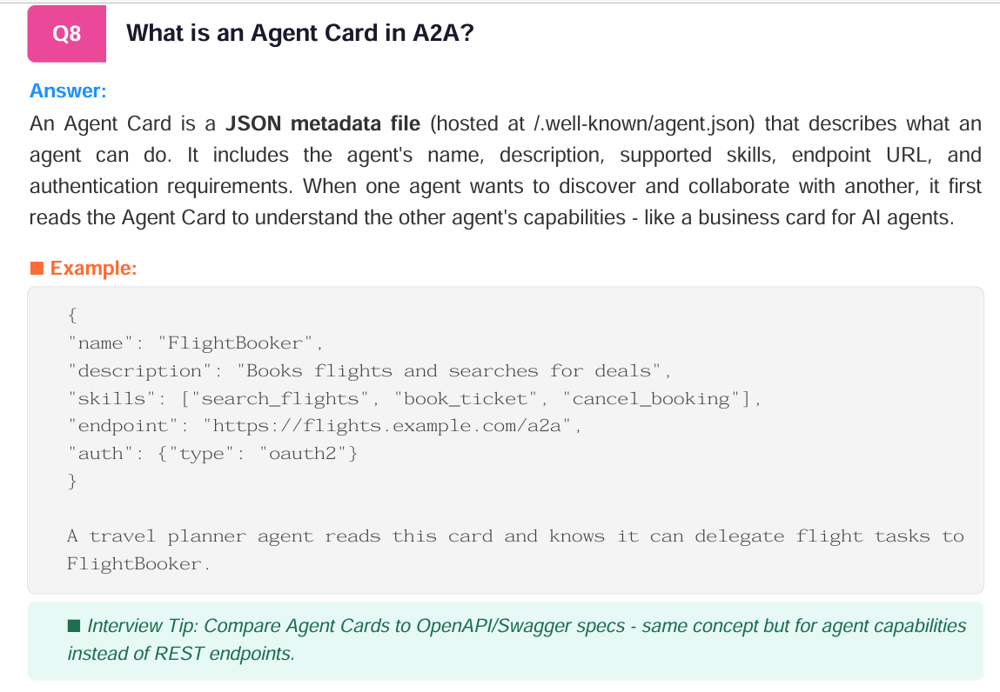

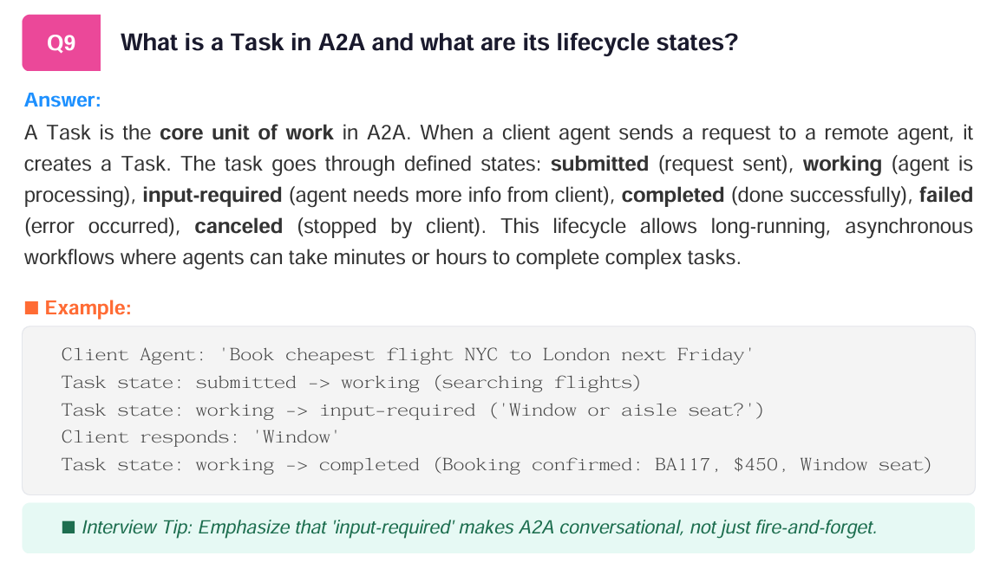

A Task is a request sent from one agent to another agent.

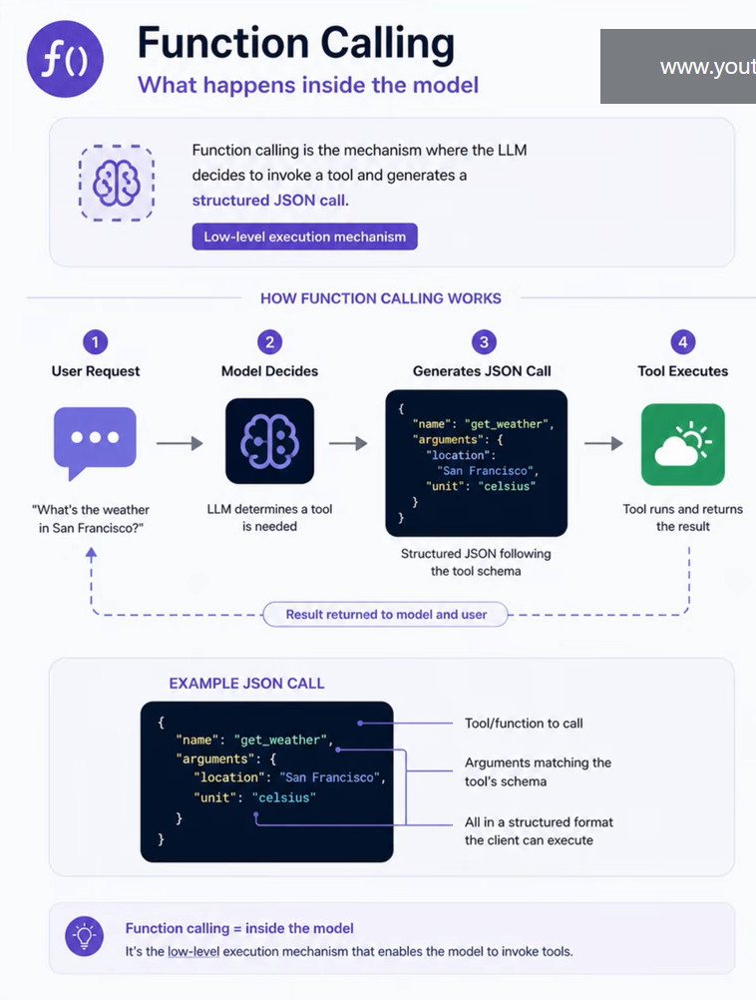

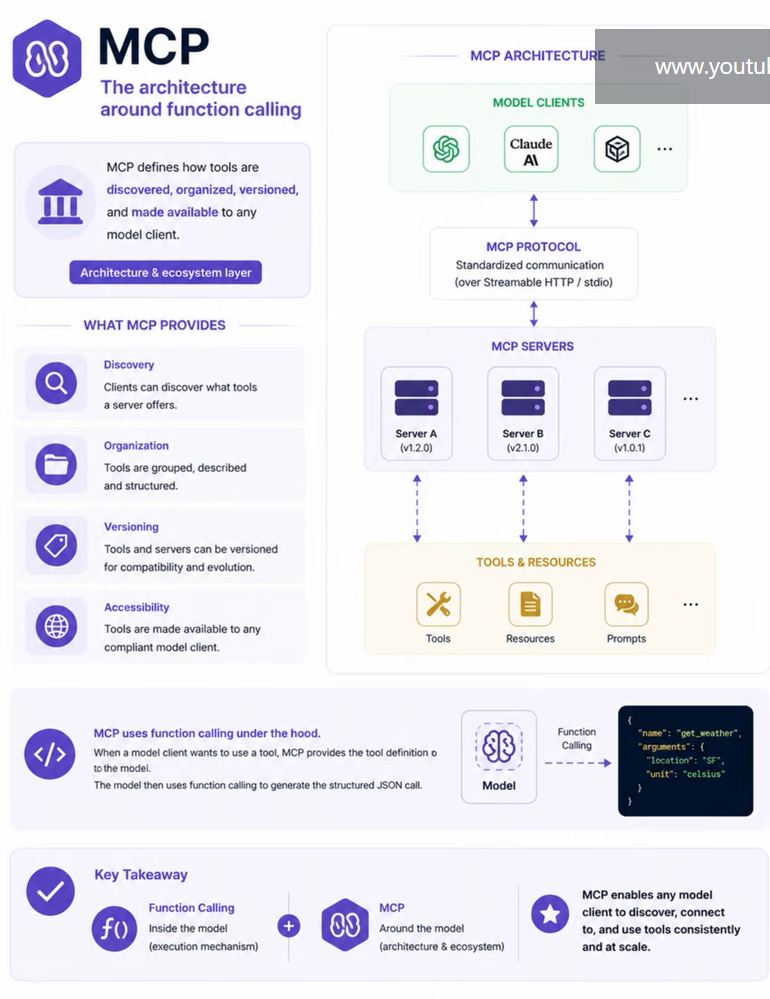

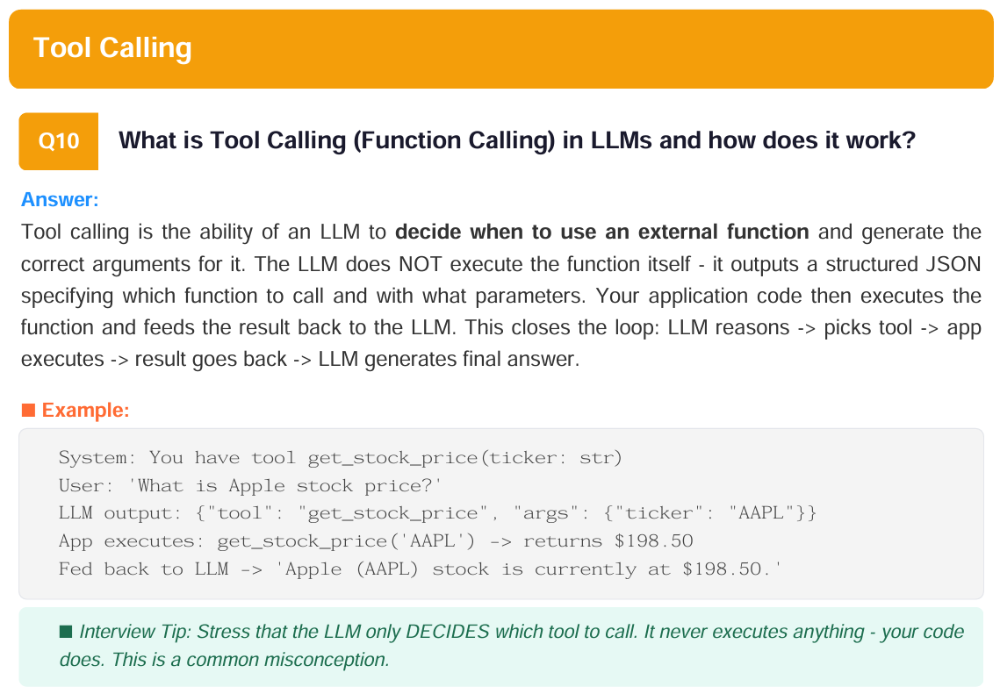

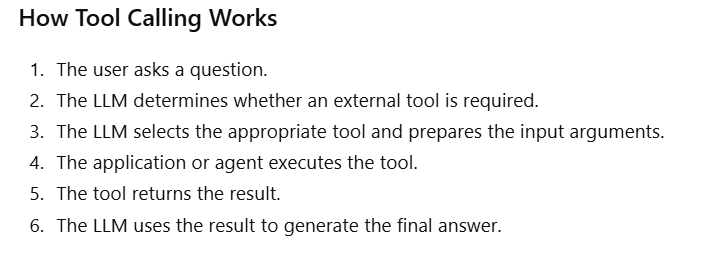

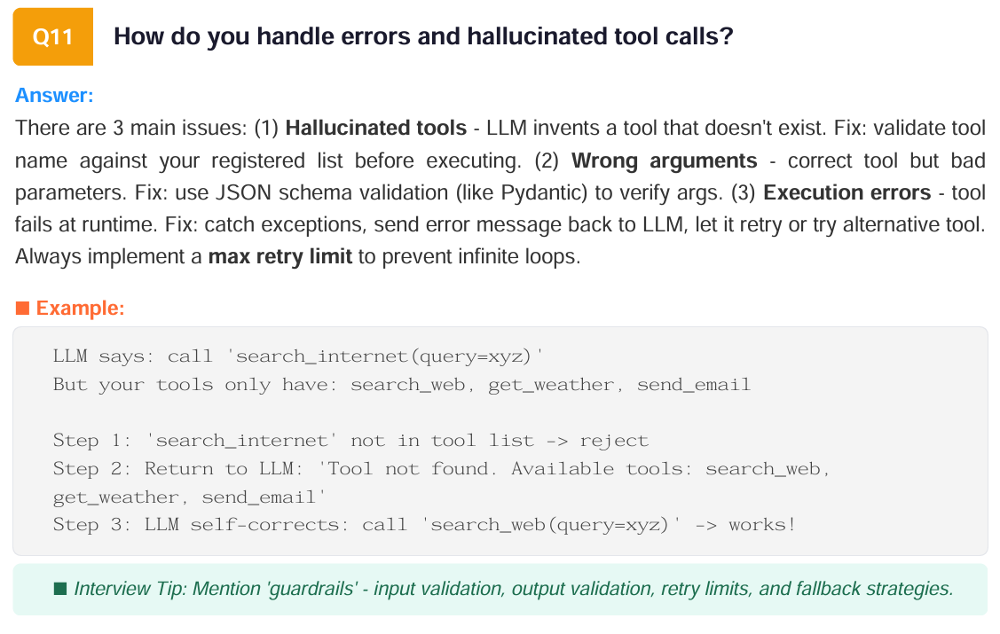

In production systems, I never execute tool calls directly from the LLM. I first validate that the requested tool exists and that its input arguments match the expected schema. If validation fails or the tool returns an error, I provide the error back to the LLM for a limited number of retries. I also use guardrails, schema validation, logging, and proper exception handling to prevent hallucinated or unsafe tool calls. This ensures the agent interacts with external systems safely and reliably.

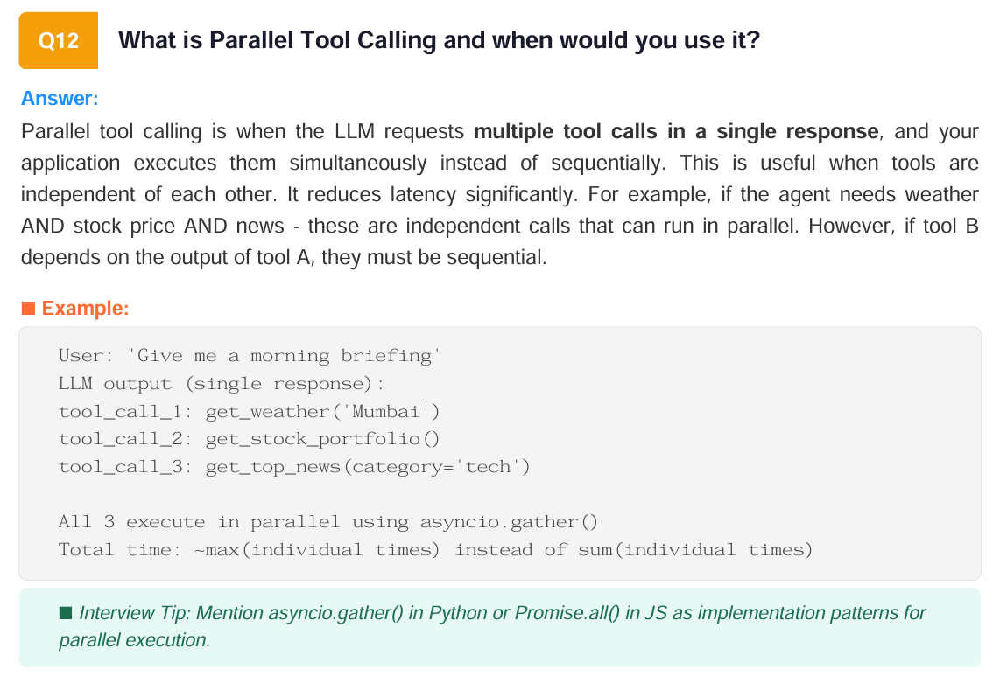

# Memory in Agents

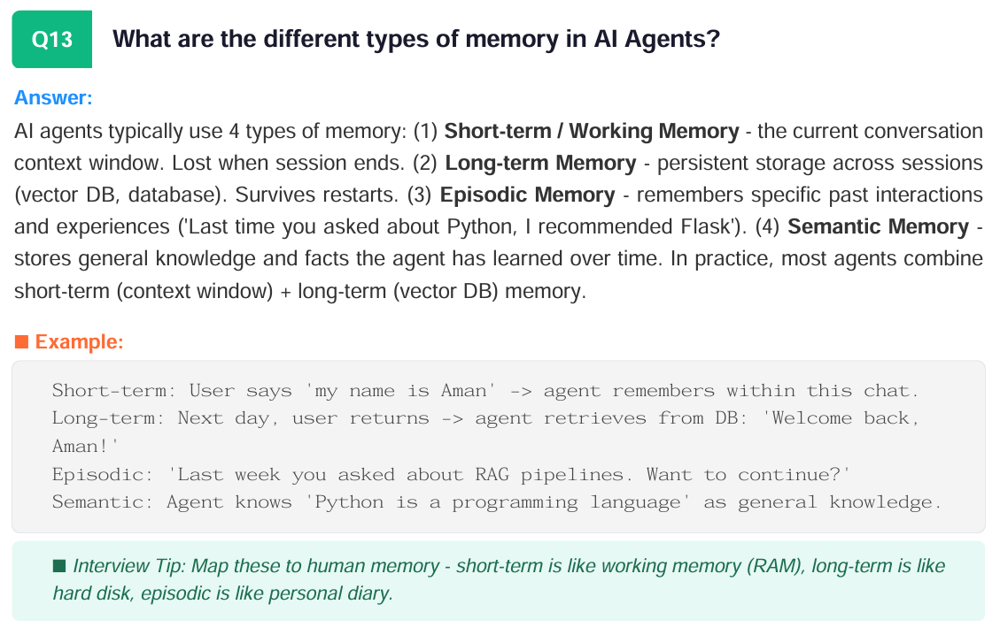

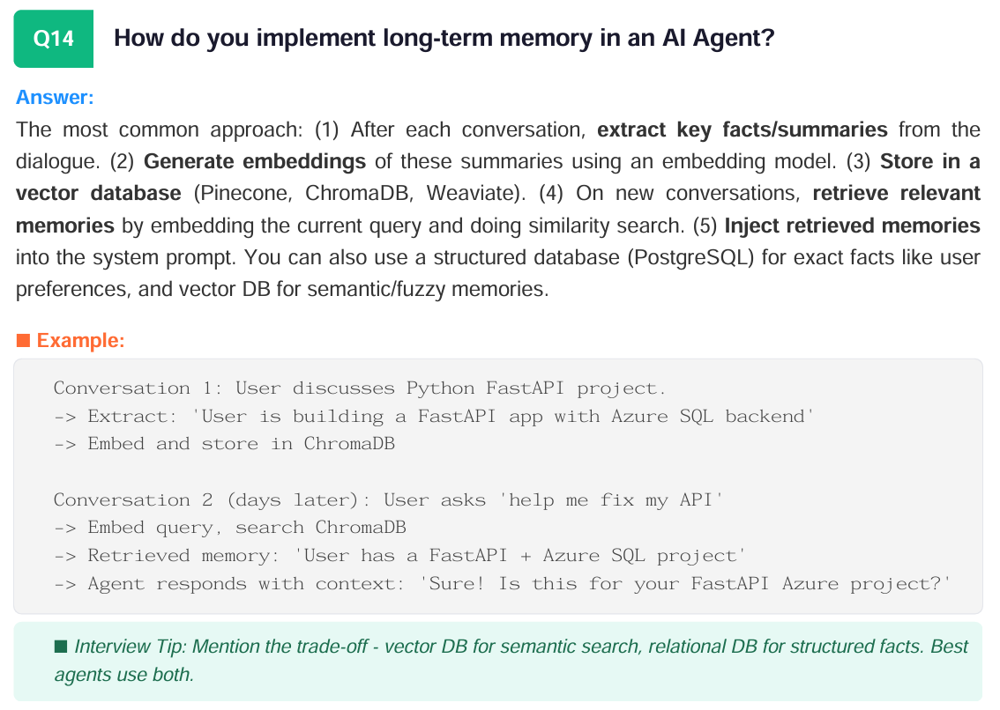

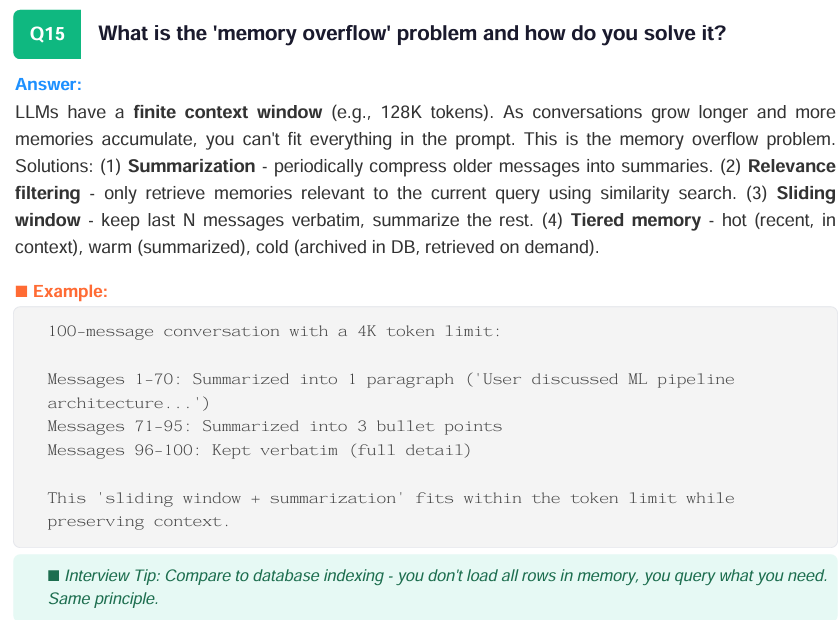

# RAG vs Agents

# How do you handle hallucinations in RAG?

- Even when the correct context is retrieved, an LLM can sometimes generate information that isn't supported by that context. I address this using faithfulness guardrails—for example, instructing the model to answer only from retrieved context and explicitly say when information is unavailable. I also enforce source citations and can add a post-generation validation step to check whether the claims in the answer are supported by the retrieved chunks. If a claim isn't supported, I can reject or regenerate the response.

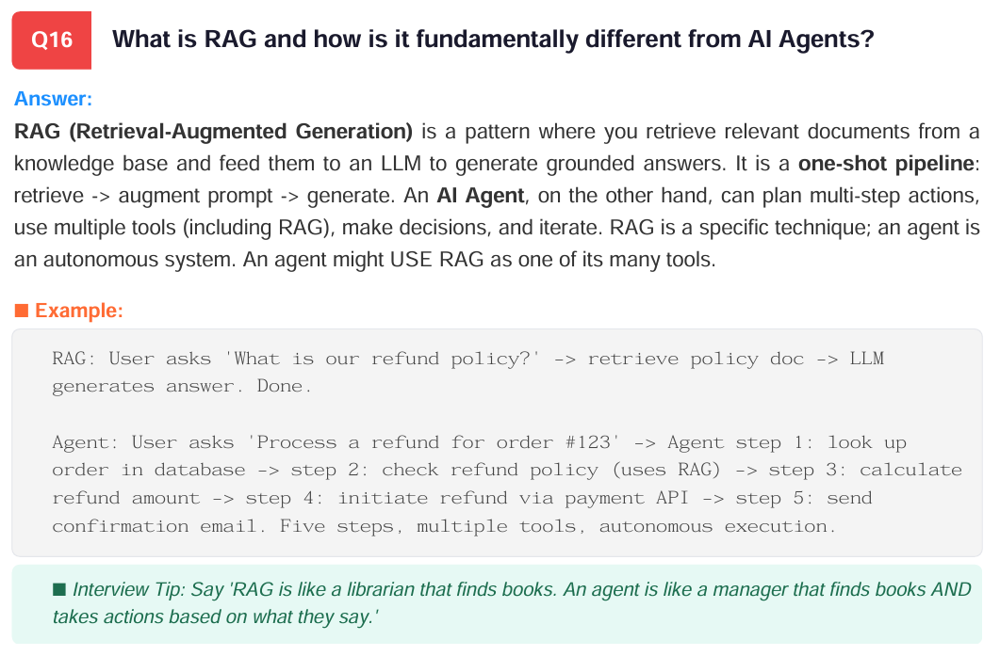

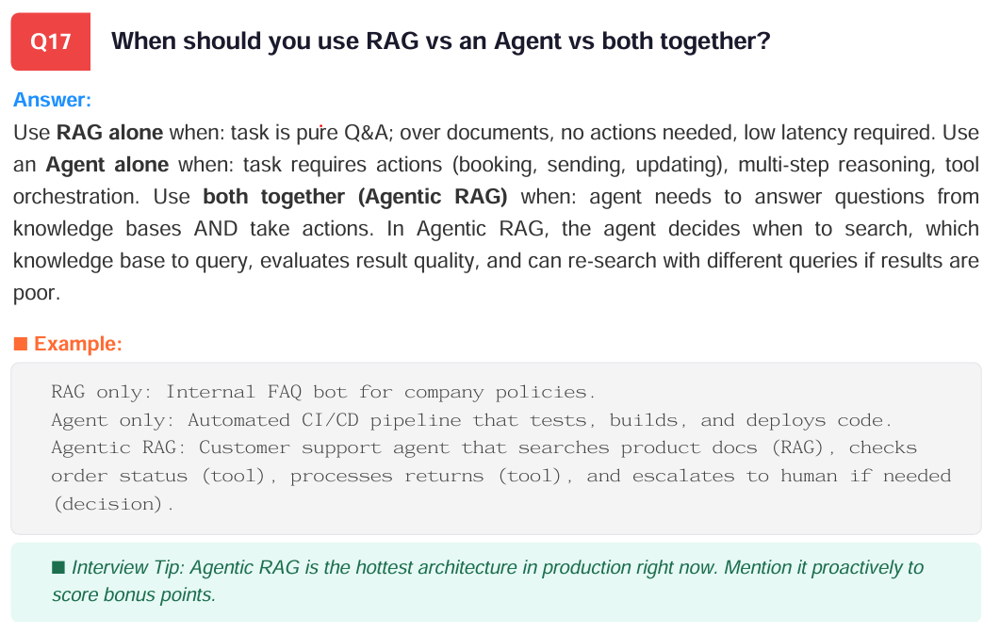

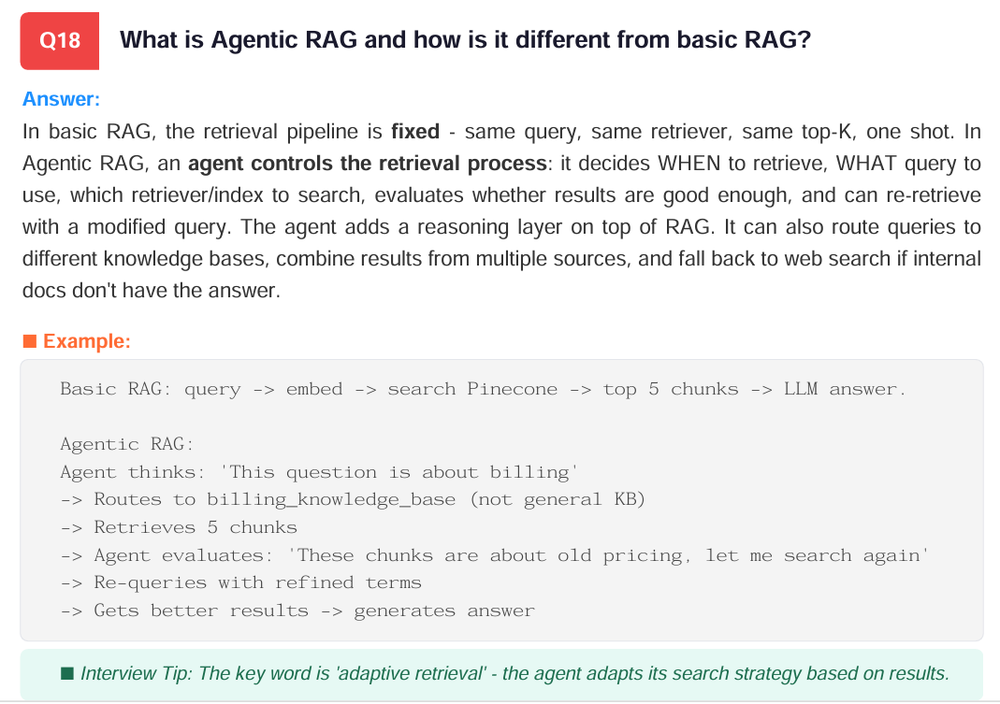

# Multi-Agent Systems

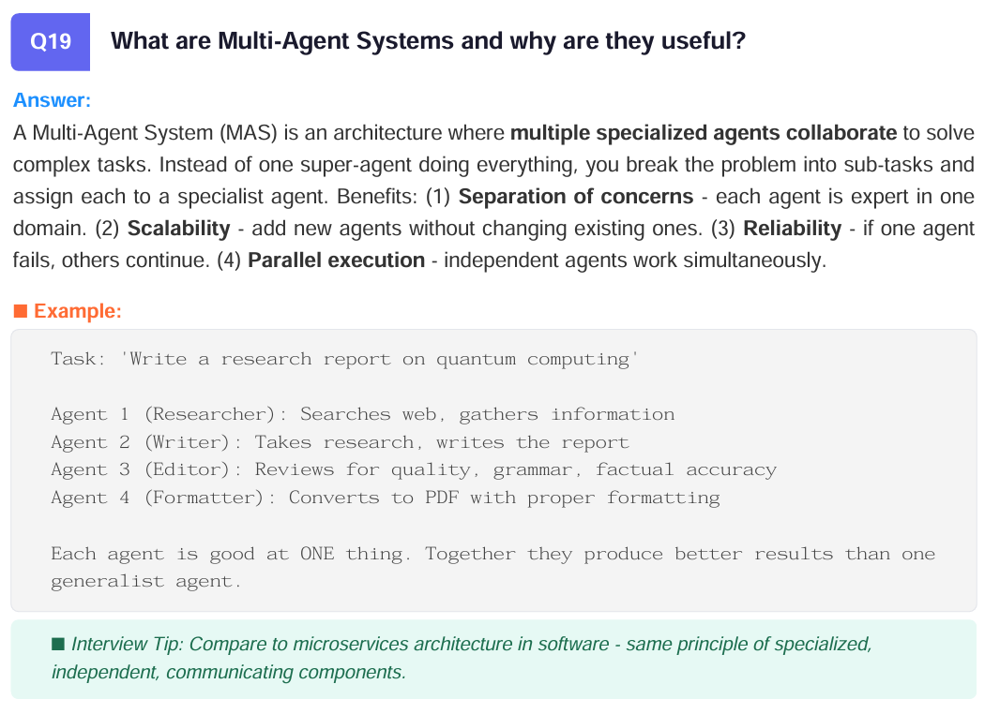

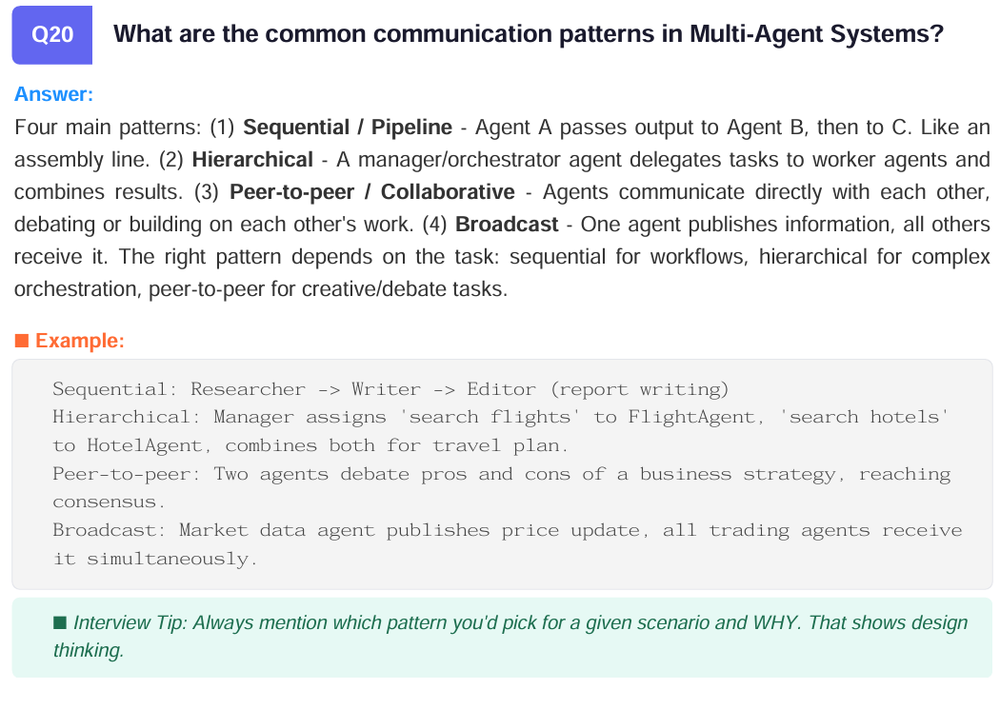

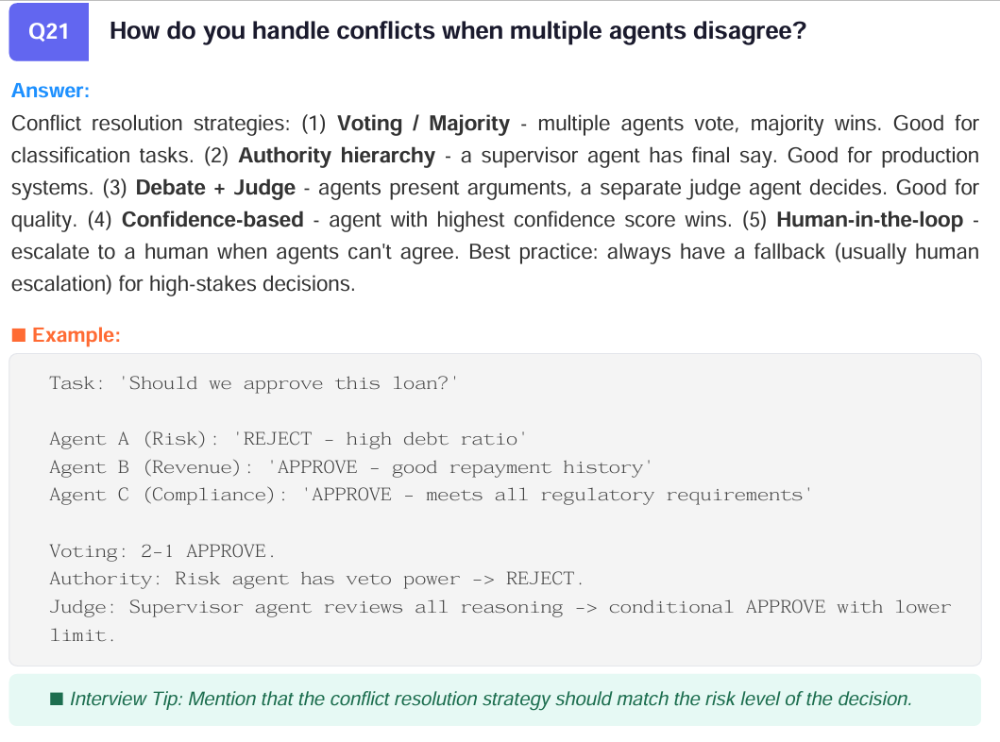

# Deep Agent:

A Deep Agent is an AI agent built around an LLM using an Agent Harness and an Agent Runtime, where the harness provides capabilities like planning, memory, context management, and tool orchestration, while the runtime executes and manages those actions to complete complex, multi-step tasks autonomously.

In one line:

Deep Agent = LLM + Harness (how the agent works) + Runtime (environment) (where/how it executes).


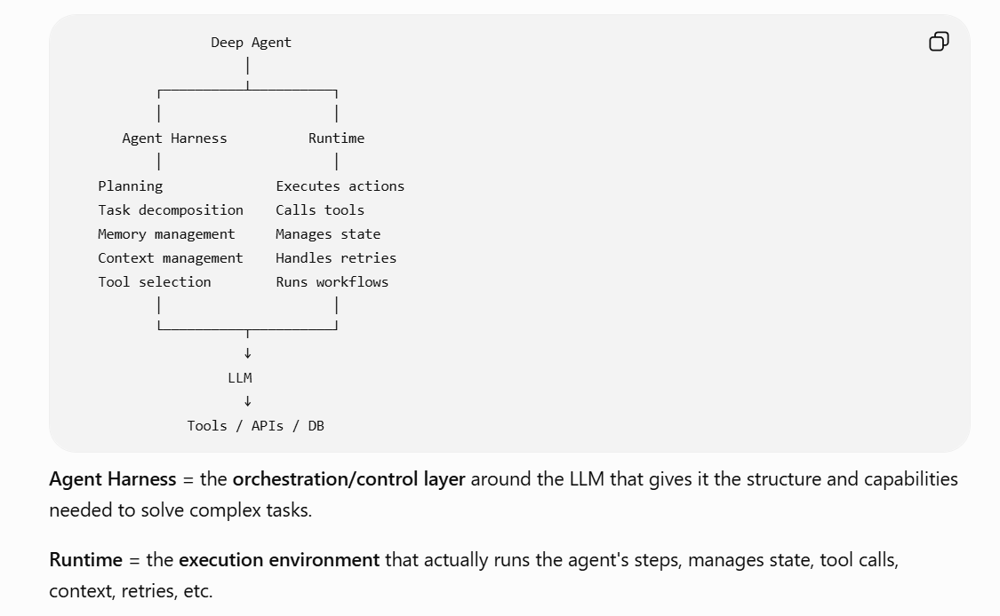

"A Deep Agent focuses on depth of execution. Its harness provides capabilities such as planning, task decomposition, memory, context management, tool orchestration and sub-agent delegation, while its runtime manages the actual execution, state, tool calls, retries and checkpoints.

A Multi-Agent system, on the other hand, focuses on collaboration between multiple specialized agents. These agents can themselves have their own harnesses and runtimes. Therefore, Deep Agent and Multi-Agent are not opposites—a Deep Agent can use multiple sub-agents internally."

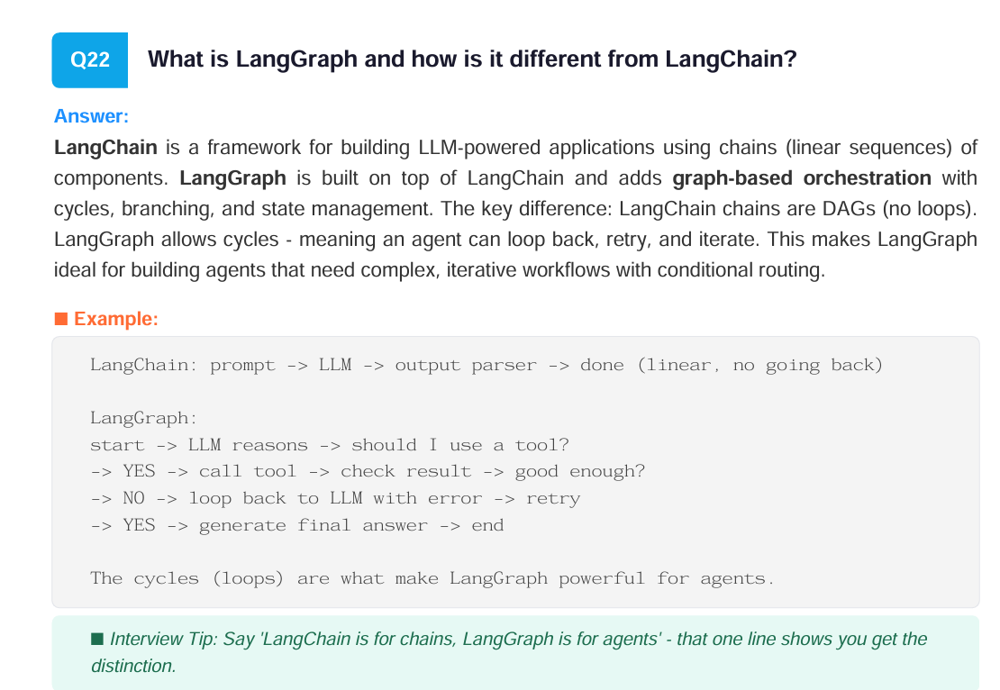

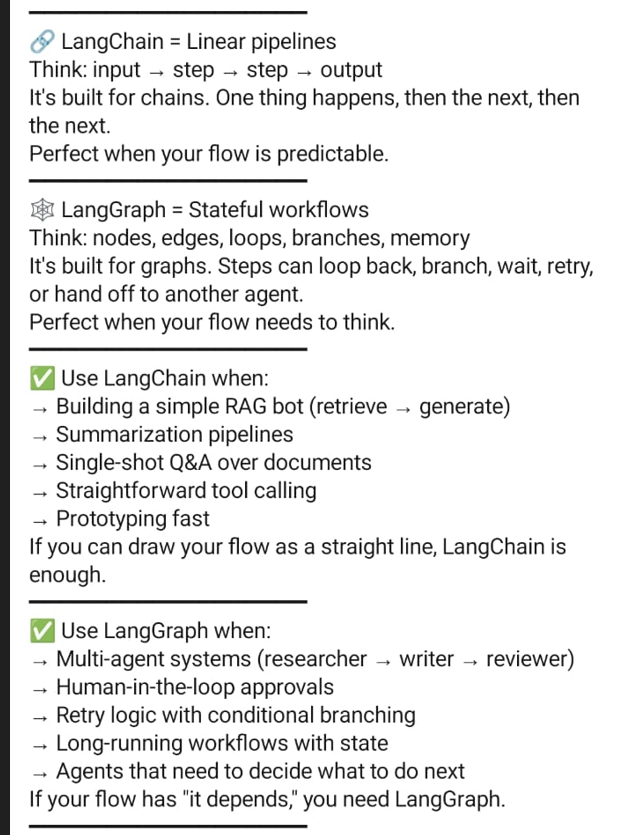

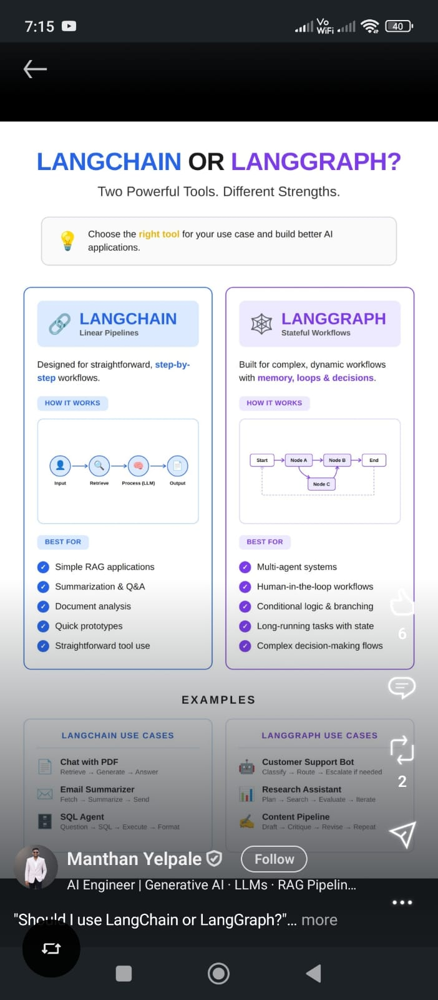

# FastAPI

Flask:- (It is built on WSGI)

Flask and FastAPI are both Python web frameworks used to build web applications and REST APIs.

Flask is a lightweight microframework — it provides only the core routing and request-handling features, and we need to add functionalities like data validation, authentication, or API docs through extensions, which makes it simple and flexible but requires more manual setup.


# FastAPI:-
FastAPI is a modern, high-performance Python web framework for building structured APIs, It's built on top of Starlette and Pydantic.

Starlette handles the core web layer — routing, requests, and responses, including async support — (Starlette is built on ASGI)

while Pydantic handles automatic data validation, making sure incoming and outgoing data matches the expected schema.

On top of that foundation, FastAPI provides things like automatic interactive API documentation via Swagger UI and ReDoc, and native support for asynchronous programming, which is especially useful for I/O-heavy backends — like calling an LLM provider or querying a vector database — where we want to handle multiple requests concurrently without blocking.


-
FastAPI gives us a modern, high-performance python web framework for building structed APIs, while providing automatic data validation through Pydantic,
and generates interactive API documentation using Swagger UI and ReDoc, and it supports Asynchronous programming and reusable application components.


- WSGI (Web Server Gateway Interface)

- ASGI (Asynchronous Server Gateway Interface)

WSGI handles synchronous Python web apps, while ASGI enables asynchronous, high-performance and real-time applications.

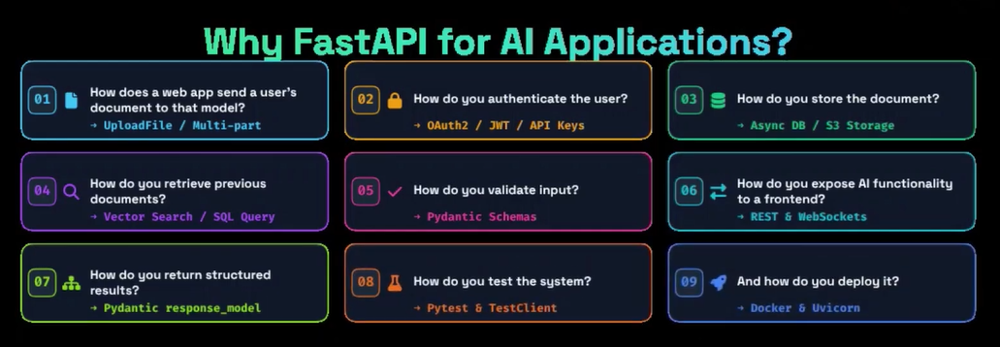